Note: for a better performance, since we know the CNN performs better than the CNN2, we're skipping the tensorboard part which purpose is to compare both models. Also, we're skipping the whole CNN2 computing & training, ever since its costly in terms of resources, and purposeless in terms of application. <br> <br>

This Notebook is meant to create a CNN that detects if the image shown its a cat or a dog, it poses some questions to the reader, and also encourages the reader to take a glance at the comments in order to gain a better understanding of what the code its actually doing.

The images's folder is on the link in the README.

Nice coding, and happy learning.

Ps: you're a cat or a dog person?? Lasciami sapere ;)

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

datos, metadatos = tfds.load('cats_vs_dogs', as_supervised = True, with_info = True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.1WPAKX_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [ ]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmp5gqn5dgctfds'),
    file_format=tfrecord,
    download_size=Unknown size,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
  

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

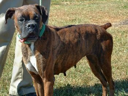
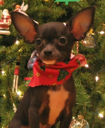
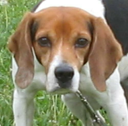
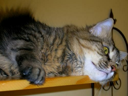
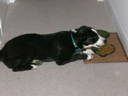

In [ ]:
tfds.as_dataframe(datos['train'].take(5), metadatos)

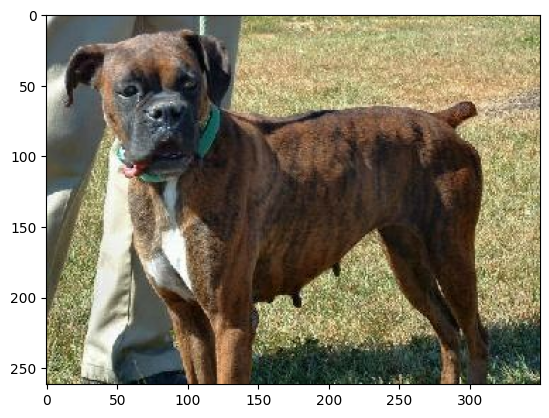

In [ ]:
import matplotlib.pyplot as plt

for i, (imagen, etiqueta) in enumerate(datos['train'].take(1)):
  plt.imshow(imagen)

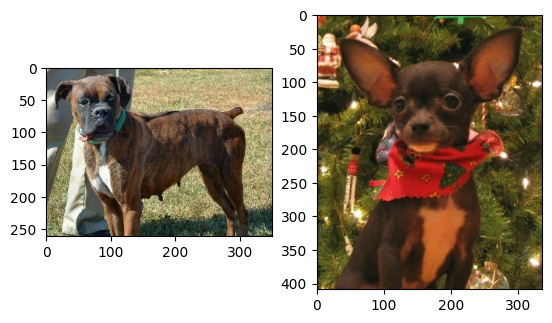

In [ ]:
for i, (imagen, etiqueta) in enumerate(datos['train'].take(2)):
  plt.subplot(1, 2, i+1)
  plt.imshow(imagen)

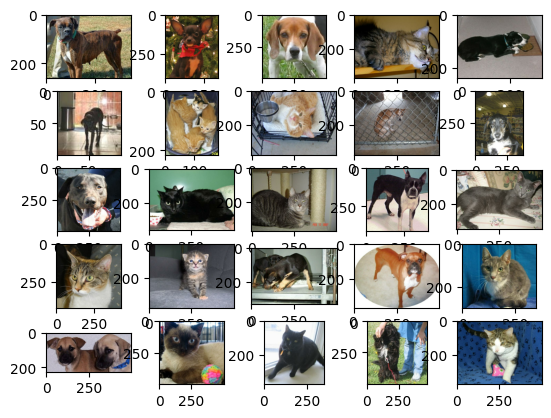

In [ ]:
for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  plt.subplot(5, 5, i+1)
  plt.imshow(imagen)

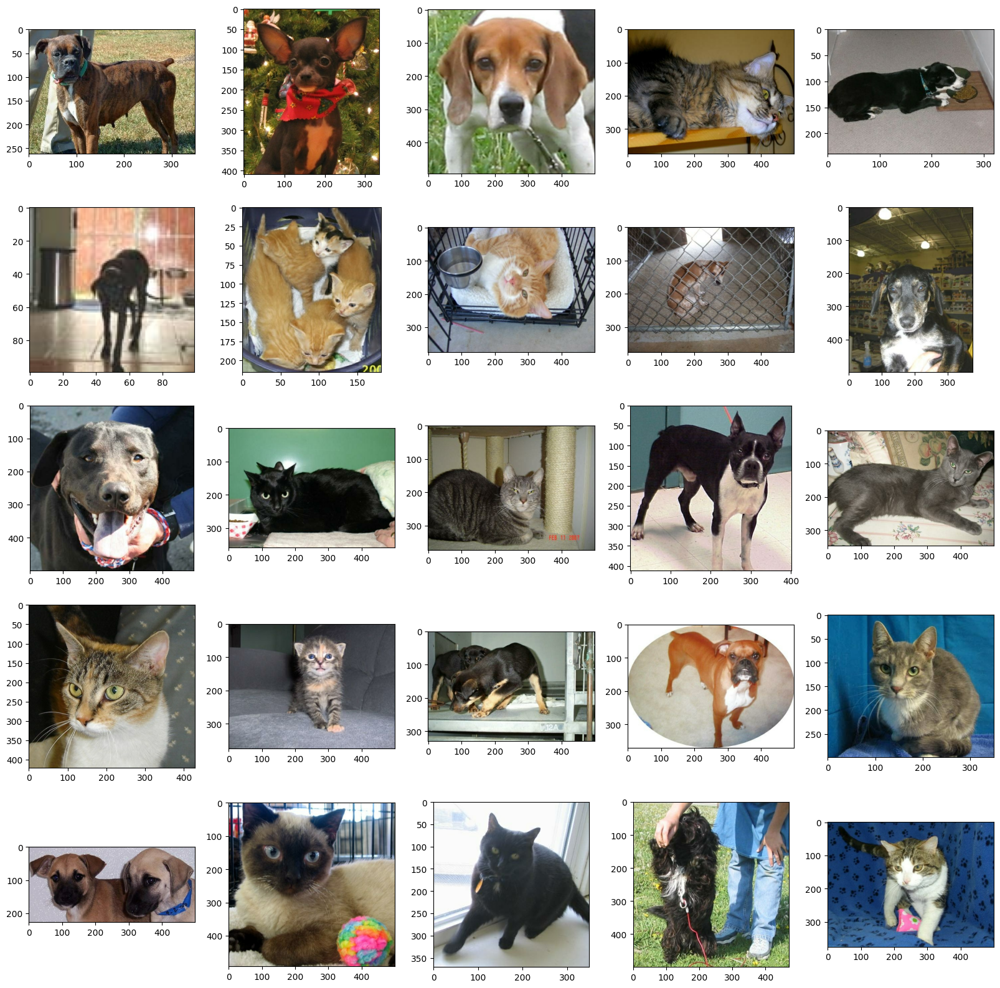

In [ ]:
plt.figure(figsize = (20,20))
for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  plt.subplot(5, 5, i+1)
  plt.imshow(imagen)

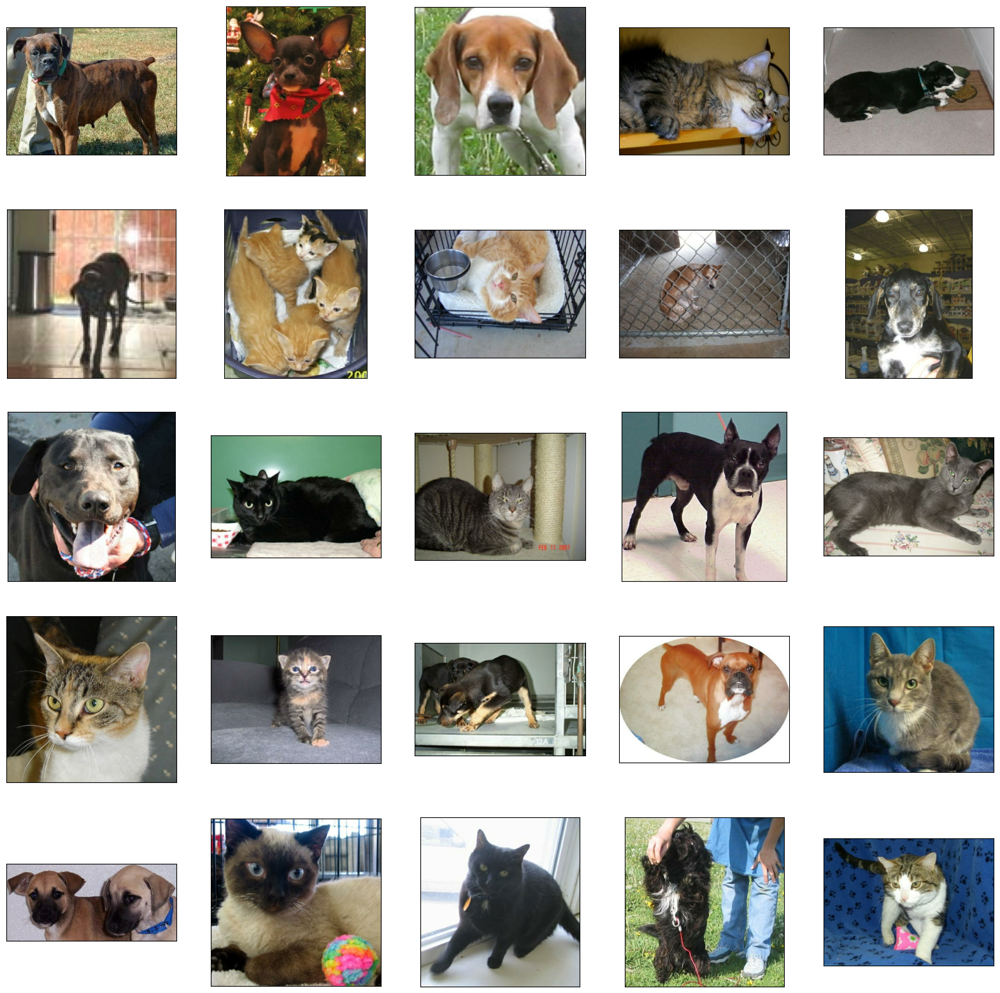

In [ ]:
plt.figure(figsize = (20,20))
for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)

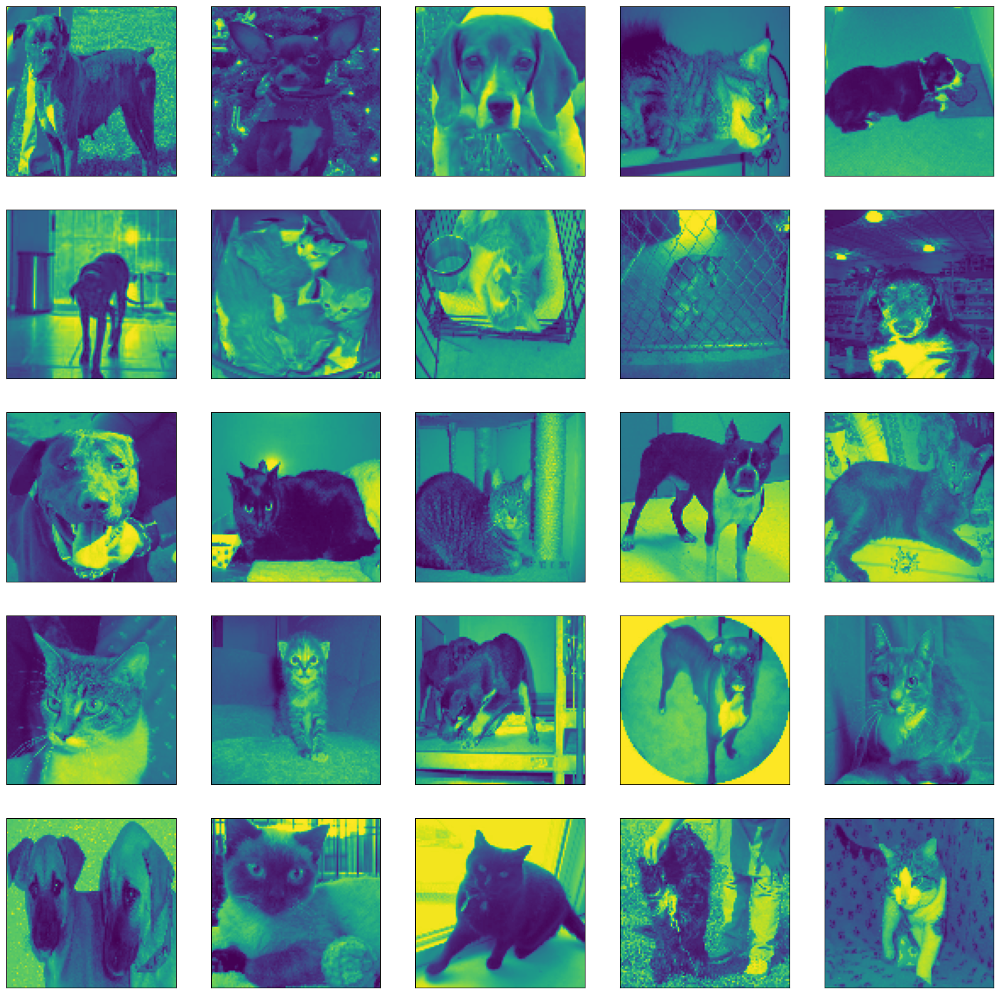

In [ ]:
import cv2

plt.figure(figsize = (20,20))
TAMANO_IMG = 100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG,TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)

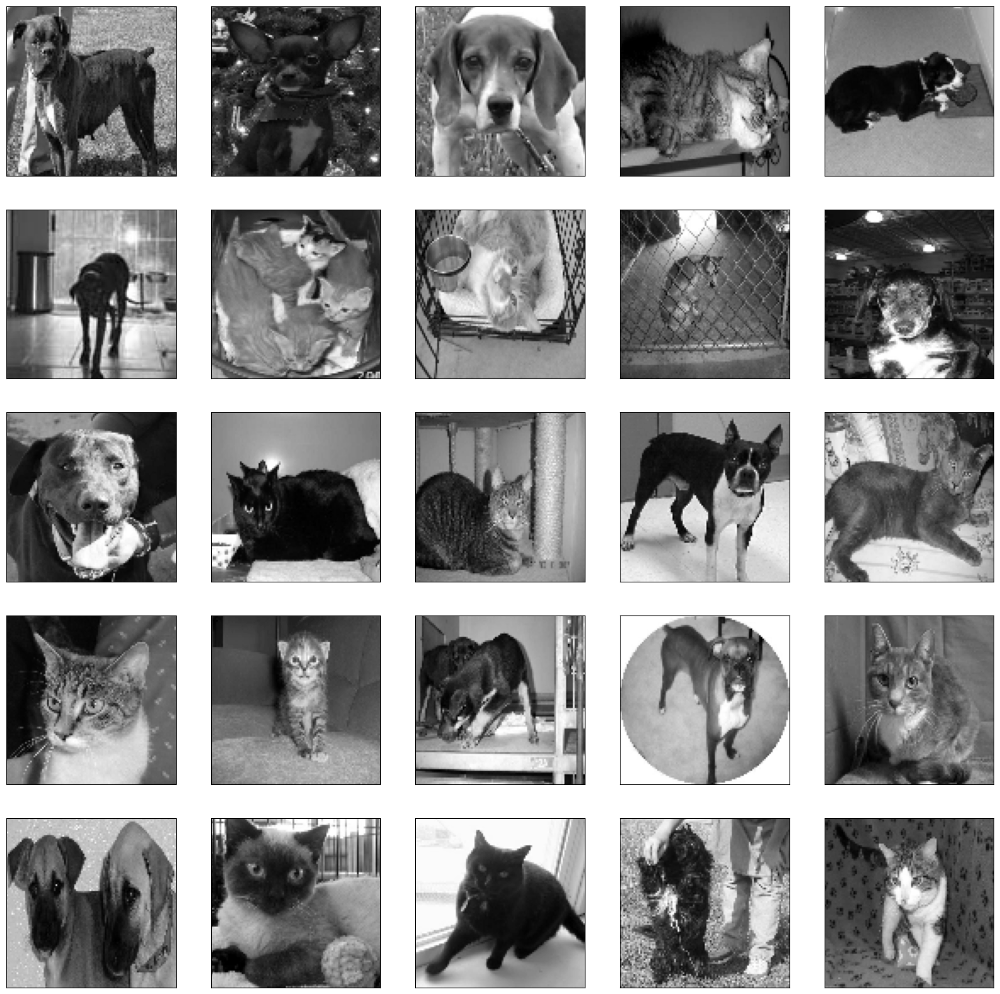

In [ ]:
import cv2

plt.figure(figsize = (20,20))
TAMANO_IMG = 100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG,TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)
  plt.imshow(imagen, cmap = 'gray')

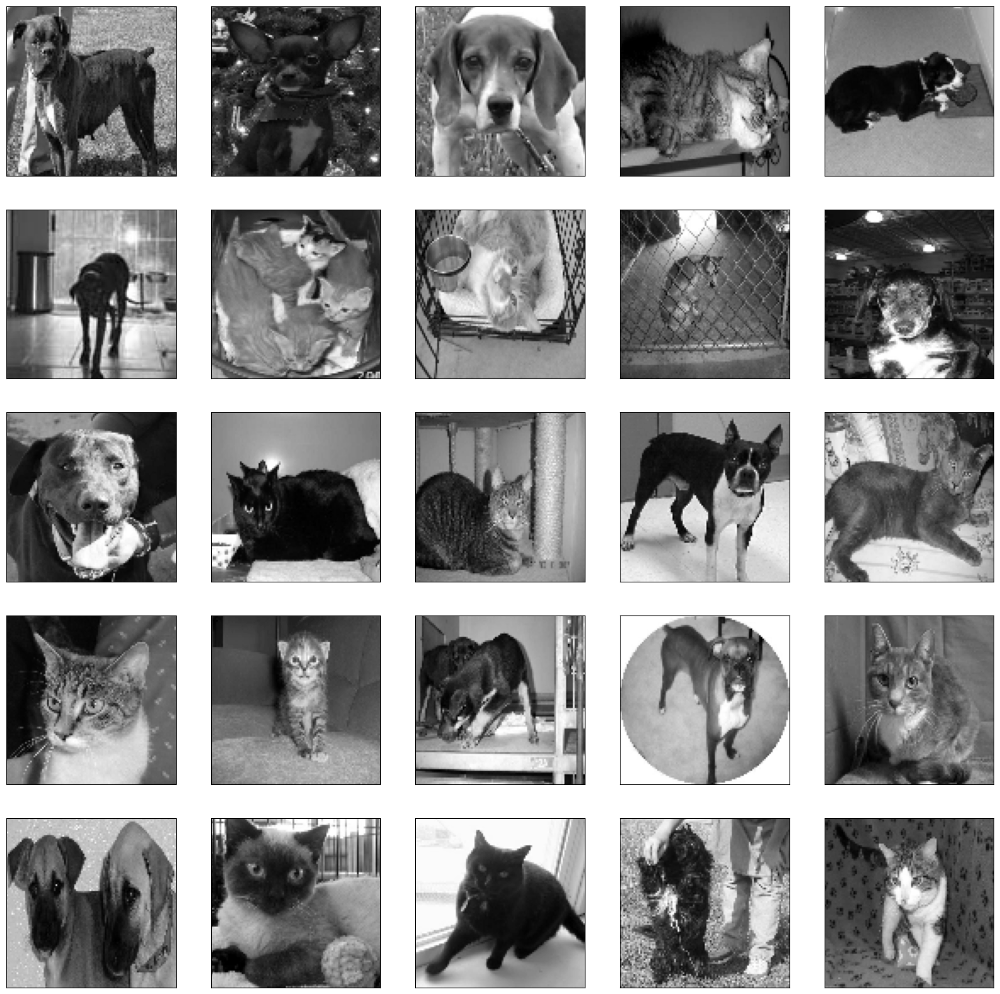

In [ ]:
import cv2

plt.figure(figsize = (20,20))
TAMANO_IMG = 100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG,TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)
  plt.imshow(imagen, cmap = 'gray')

In [ ]:
#Variable que contendra todos los pares de los datos (imagen y etiqueta) ya modificados (blanco y negro, 100x100)
datos_entrenamiento = []

In [ ]:
import cv2

plt.figure(figsize = (20,20))
TAMANO_IMG = 100

for i, (imagen, etiqueta) in enumerate(datos['train']):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG,TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)
  datos_entrenamiento.append([imagen, etiqueta])


<Figure size 2000x2000 with 0 Axes>

In [ ]:
datos_entrenamiento[0]

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [ ]:
len(datos_entrenamiento) #Estamos sin aumento de datos, así estamos bien

23262

In [ ]:
X = []  #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)


In [ ]:
X #We need these to be normalized, so it can be closer to 0 (which stands for cat) or 1(which stands for dog)

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 array([[[149],
         [114],
         [ 93],
         ...,
         [103],
         [ 72],
         [ 81]],
 
        [[127],
         [ 63],
         [ 79],
         ...,
         [131],
         [ 70],
         [ 98]],
 
        [[ 82],
         [ 65],
         [ 58],
         ...,
      

In [ ]:
import numpy as np

X = np.array(X).astype(float) / 255

In [ ]:
X #Efectively normalized

array([[[[0.97647059],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76862745],
         [0.56078431]],

        [[0.90980392],
         [0.49803922],
         [0.34509804],
         ...,
         [0.73333333],
         [0.70588235],
         [0.72941176]],

        [[0.67058824],
         [0.34117647],
         [0.3254902 ],
         ...,
         [0.50588235],
         [0.61960784],
         [0.65098039]],

        ...,

        [[0.44313725],
         [0.67843137],
         [0.63529412],
         ...,
         [0.56078431],
         [0.61176471],
         [0.46666667]],

        [[0.54901961],
         [0.59607843],
         [0.67058824],
         ...,
         [0.38431373],
         [0.60784314],
         [0.60392157]],

        [[0.35686275],
         [0.42745098],
         [0.65490196],
         ...,
         [0.18039216],
         [0.2       ],
         [0.18431373]]],


       [[[0.58431373],
         [0.44705882],
         [0.36

In [ ]:
y # This has, merely, tensors. Let's convert it to a numpy array

[<tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64

In [ ]:
y = np.array(y)

In [ ]:
y #Job done here

array([1, 1, 1, ..., 0, 1, 0])

In [ ]:
X.shape # 23262 entradas, each one with an image of 100x100, and only 1 channel of color

(23262, 100, 100, 1)

### architecture and hyperparameters

In [ ]:
modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (100, 100, 1)),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
modeloDenso.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

modeloCNN.compile(optimizer = 'adam',
                  loss = 'binary_crossentropy',
                  metrics = ['accuracy'])

modeloCNN2.compile(optimizer= 'adam',
                   loss = 'binary_crossentropy',
                   metrics = ['accuracy'])


### Importing TensorbBoard (Great Upgrade)

In [ ]:
from tensorflow.keras.callbacks import TensorBoard

What are "callbacks"?

In [ ]:
#X_resized = np.array([cv2.resize(img, (100, 100)) for img in X])

In [ ]:
'''
%%time
tensorboardDenso = TensorBoard(log_dir= 'logs/modeloDenso')
modeloDenso.fit(X,y, batch_size= 32,
                validation_split = 0.15,
                epochs = 100,
                callbacks = [tensorboardDenso], verbose = 1) #After each epoch, it'll call this function which will save the result of the epoch when it finishes running.
                                                    #THis way, at the end of the training, it'll save them all (the epochs) and we'll be able to visualize the results using TensorBoard
'''

SyntaxError: incomplete input (<ipython-input-28-c42a38d2d189>, line 1)

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/modeloDenso

In [ ]:
tensorboardCNN = TensorBoard(log_dir= 'logs/cnn')
modeloCNN.fit(X,y, batch_size= 32,
                validation_split = 0.15,
                epochs = 100,
                callbacks = [tensorboardCNN], verbose = 1)

In [ ]:
'''
%%time
tensorboardCNN2 = TensorBoard(log_dir= 'logs/cnn2')
modeloCNN2.fit(X,y, batch_size= 32,
                validation_split = 0.15,
                epochs = 100,
                callbacks = [tensorboardCNN2], verbose = 1) '''

https://www.youtube.com/watch?v=DbwKbsCWPSg&t=301s 15:27.  el Colab guía  es éste: https://colab.research.google.com/drive/1DQc8a-WOTctenvoy5T0lWUXn47EuteCy?usp=sharing   





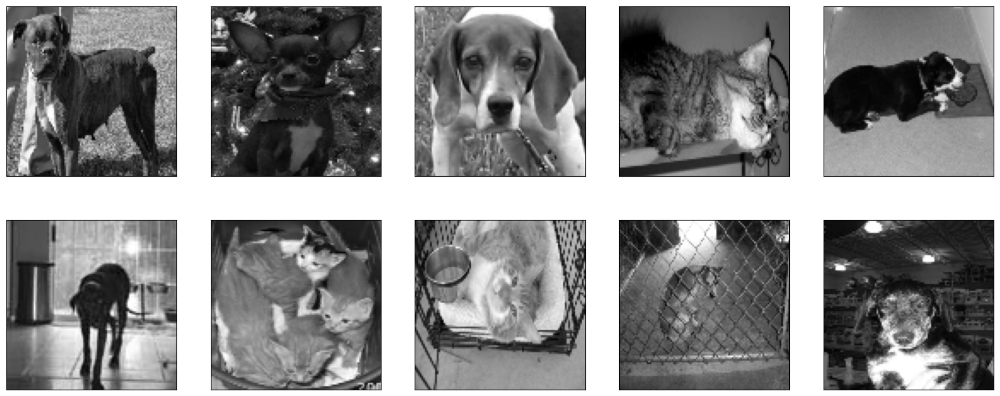

In [ ]:
plt.figure(figsize = (20,8))
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100, 100), cmap = 'gray')

Duda: ¿estamos haciendo oversampling?

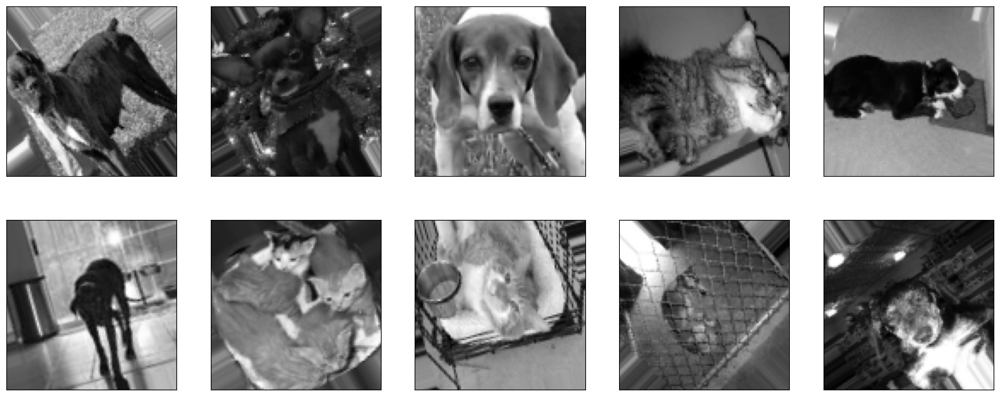

In [ ]:
# Importar el generador con aumento de datos
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Assuming X is a numpy array of shape (num_samples, height, width, channels)
datagen = ImageDataGenerator(rotation_range=50)  # Random rotation of images

datagen.fit(X)  # Fit the generator to the data

plt.figure(figsize=(20, 8))  # Set the figure size

# Generate augmented images in batches of 10
for data, labels in datagen.flow(X, y, batch_size=10, shuffle=False):
    for i in range(10):  # Plot 10 images
        plt.subplot(2, 5, i+1)
        plt.xticks([])  # Remove x-ticks
        plt.yticks([])  # Remove y-ticks
        # Ensure data[i] is reshaped correctly. Adjust (100, 100) as needed.
        plt.imshow(data[i].reshape(100, 100), cmap='gray')
    break  # Plot only the first batch

plt.show()  # Display the figure


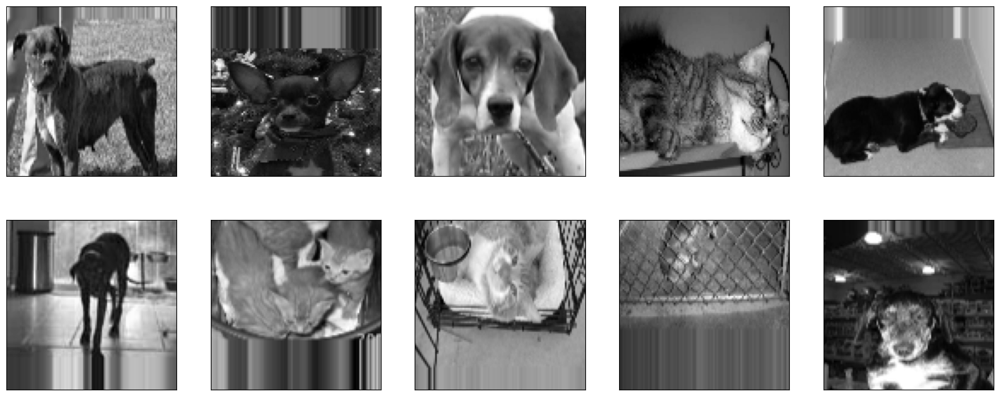

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the data generator with width shift augmentation
datagen = ImageDataGenerator(
    width_shift_range=0.50  # Shift the image horizontally with a range between 0 and 1
)

datagen.fit(X)  # Fit the generator to the data

plt.figure(figsize=(20, 8))  # Set the figure size

# Generate augmented images in batches of 10
for data_batch, labels_batch in datagen.flow(X, y, batch_size=10, shuffle=False):
    for i in range(10):  # Plot 10 images
        plt.subplot(2, 5, i+1)
        plt.xticks([])  # Remove x-ticks
        plt.yticks([])  # Remove y-ticks
        # Ensure data_batch[i] is reshaped correctly. Adjust (100, 100) as needed.
        plt.imshow(data_batch[i].reshape(100, 100), cmap='gray')
    break  # Plot only the first batch

plt.show()  # Display the figure


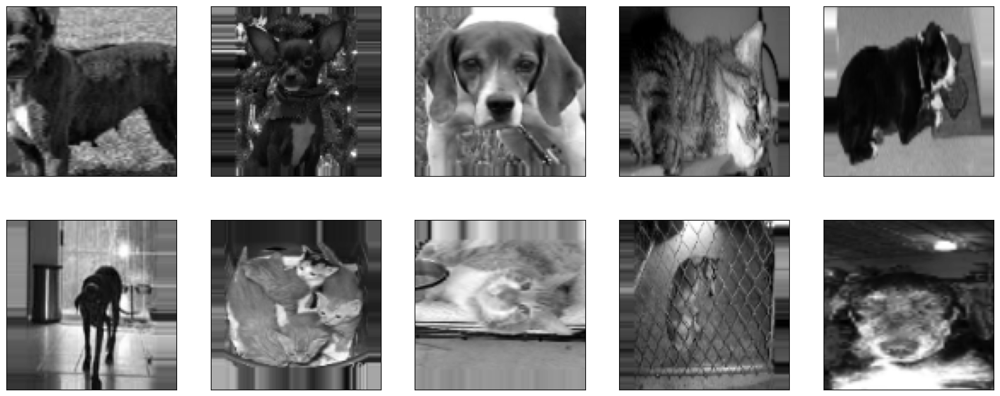

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the data generator with zoom augmentation
# zoom_range=[0.5, 1.5] means zoom out to 50% and zoom in to 150%
datagen = ImageDataGenerator(
    zoom_range=[0.5, 1.5]
)

datagen.fit(X)  # Fit the generator to the data

plt.figure(figsize=(20, 8))  # Set the figure size

# Generate augmented images in batches of 10
for data_batch, labels_batch in datagen.flow(X, y, batch_size=10, shuffle=False):
    for i in range(10):  # Plot 10 images
        plt.subplot(2, 5, i+1)
        plt.xticks([])  # Remove x-ticks
        plt.yticks([])  # Remove y-ticks
        # Use data_batch[i] for the augmented image
        plt.imshow(data_batch[i].reshape(100, 100), cmap='gray')
    break  # Plot only the first batch

plt.show()  # Display the figure



### The generator

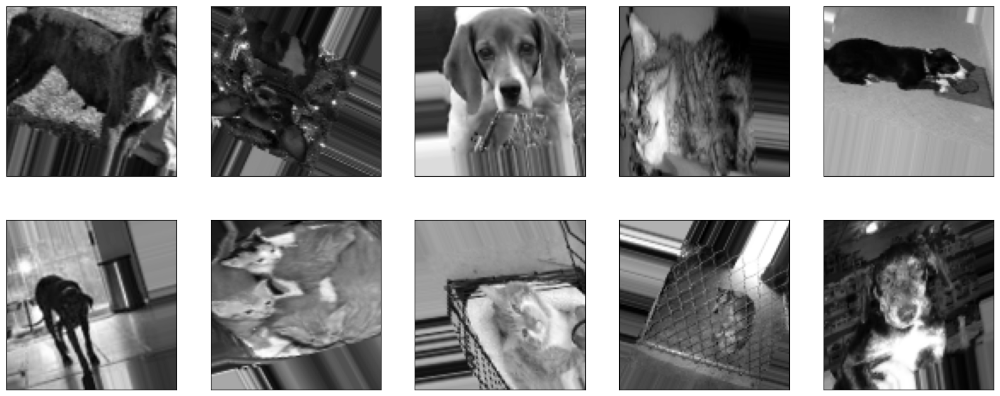

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range = 30, #what's the available range of values for this one?
    width_shift_range = 0.2,
height_shift_range=0.2,
    shear_range=15,
zoom_range=[0.7, 1.4],  # This is to specify a range of values for zoom
    horizontal_flip=True,
    vertical_flip=True,# also with "horizontal_flip" for performing random rotations to the images

)

datagen.fit(X)

plt.figure(figsize=(20, 8))

for data_batch, labels_batch in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    # Use data_batch[i] for plotting instead of imagen
    plt.imshow(data_batch[i].reshape(100, 100), cmap = 'gray')
  break
plt.show()


### Models with the DataGen

In [ ]:
modeloDenso_AD = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (100, 100, 1)),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
modeloDenso_AD.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

modeloCNN_AD.compile(optimizer = 'adam',
                  loss = 'binary_crossentropy',
                  metrics = ['accuracy'])

modeloCNN2_AD.compile(optimizer= 'adam',
                   loss = 'binary_crossentropy',
                   metrics = ['accuracy'])


In [ ]:
len(X)*.85 #19700
len(X)- 19700 #3562

X_entrenamiento = X[:19700] #85% of data
X_validacion = X[19700:] #15%

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [ ]:
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size = 32)

###DICA: garbageCollector

In [ ]:
#Garbage Collector (THIS EASES THE RAM!!)
import gc
gc.collect()

39454

duda en los steps: qué estamos haciendo y por qué lo estamos haciendo?

In [ ]:
'''
%%time
tensorboardDenso_AD = TensorBoard(log_dir = 'logs/denso_AD')
modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs = 100,
    validation_data = (X_validacion, y_validacion),
steps_per_epoch = int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps = int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD])'''

SyntaxError: incomplete input (<ipython-input-39-b0f3a4ae04ac>, line 1)

In [ ]:
%%time
tensorboardCNN_AD = TensorBoard(log_dir = 'logs/cnn_AD')
modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs = 50,
    validation_data = (X_validacion, y_validacion),
steps_per_epoch = int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps = int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
    )

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


616/616 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - accuracy: 0.5370 - loss: 0.6886 - val_accuracy: 0.5949 - val_loss: 0.6615
Epoch 2/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


616/616 ━━━━━━━━━━━━━━━━━━━━ 1s 963us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 3/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step - accuracy: 0.5967 - loss: 0.6639 - val_accuracy: 0.6336 - val_loss: 0.6330
Epoch 4/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 0s 26us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 5/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - accuracy: 0.6244 - loss: 0.6459 - val_accuracy: 0.6395 - val_loss: 0.6290
Epoch 6/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 7/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6505 - loss: 0.6302 - val_accuracy: 0.6917 - val_loss: 0.5866
Epoch 8/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 9/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step - accuracy: 0.6717 - loss: 0.6074 - val_accuracy: 0.7204 - val_loss: 0.5580
Epoch 10/50
616/616 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 11/50

In [ ]:
%%time
'''
tensorboardCNN2_AD = TensorBoard(log_dir = 'logs/cnn_AD')
modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs = 100,
    validation_data = (X_validacion, y_validacion),
steps_per_epoch = int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps = int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
    )'''

In [ ]:
%tensorboard --logdir logs/modeloDenso

UsageError: Line magic function `%tensorboard` not found.


In [ ]:
modeloCNN_AD.save('perros-gatos-cnn-AD.h5')

In [ ]:
!pip install tensorflowjs

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 84.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 95.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 106.1 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully uni

In [ ]:
!mkdir carpeta_salida

mkdir: cannot create directory ‘carpeta_salida’: File exists


In [ ]:
!tensorflowjs_converter --input_format keras perros-gatos-cnn-AD.h5 carpeta_salida

2024-12-04 22:31:08.990314: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733351469.010720    8628 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733351469.016819    8628 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed to lookup keras version from the file,
    this is likely a weight only file
